## Vehicle Detection - Brent Wylie
[![Udacity - Self-Driving Car NanoDegree](https://s3.amazonaws.com/udacity-sdc/github/shield-carnd.svg)](http://www.udacity.com/drive)

The goals / steps of this project are the following:

Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
Estimate a bounding box for vehicles detected.

## 1.0 Load libraries, helper functions, camera parameters & SVM training

In [1]:
#Import Statements
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
#%matplotlib inline
%matplotlib qt

import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label

#Used as a wrapper read images and convert as needed. 
def read_img(file):
    img = mpimg.imread(file)
    if(file.endswith('.png')):
        img = img * 255 # To convert float into 0-255 range
        img = img.astype(np.uint8)
        return img
    elif(file.endswith('.jpg')):
        #No conversion necessary
        #img=img.astype(np.float32)/255
        return img
    else:
        print("FILE FORMAT UNEXPECTED: ", file)
    return img

#Assumes given RGB, converts to named space
def convert_color(img, cspace = None):
    destspace = None
    if cspace == 'RGB': #nothing to be done if RGB. validated.
        return img
    elif cspace == 'HSV': #validated
        destspace = cv2.COLOR_RGB2HSV
    elif cspace == 'HLS':#validated
        destspace = cv2.COLOR_RGB2HLS
    elif cspace == 'LUV':#TODO: causes error
        destspace = cv2.COLOR_RGB2LUV
    elif cspace == 'GRAY':
        destspace = cv2.COLOR_RGB2GRAY
    elif cspace == 'YUV': #TODO: Causes NaN Error
        destspace = cv2.COLOR_RGB2YUV
    elif cspace == 'YCrCb':
        destspace = cv2.COLOR_RGB2YCrCb
    if destspace != None:
        img = cv2.cvtColor(img, destspace)
    else:
        print("OH NO COLOR SPACE CONVERT IS NOT WORKING!")
    #img=img.astype(np.float32)/255
    return img

# Define a function to return HOG features and visualization
# lesson 29
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

#LessonFunction
#Lesson 22
#TODO: Check what difference is between Lesson 22 and Lesson 35 implementation
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

#LessonFunction
#lesson 22
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
# Lesson 29
#TODO Check mpimg data type normalization--tips and tricks!
#TODO: Research how combined features should be packed
#TODO: This is probably the densest function, so be careful of the if else!!
def extract_features(img, spatial_feat = True, colorhist_feat=True, hog_feat=True,
                        cspace='RGB', spatial_size=(32,32), hist_bins=32, hist_range=(0,256),
                        orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        hog_vis=False, feature_vec=True):
    # Create a list to append feature vectors to
    features = []
    # apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        feature_image = convert_color(img, cspace)
    else: 
        feature_image = np.copy(img)      
    
    if(spatial_feat==True):
        # Apply bin_spatial() to get spatial color features
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        features.append(spatial_features)
            
    if(colorhist_feat==True):
        # Apply color_hist() also with a color space option now
        hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)
        features.append(hist_features)
            
    if(hog_feat==True):
        hog_features = []
        hog_images = []
        if hog_vis==False:
            # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                if feature_vec==True: hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)  
        else:
            if hog_channel == 'ALL':
                for channel in range(feature_image.shape[2]):
                    hog_feat, hog_img = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=True, feature_vec=True)
                    hog_features.append(hog_feat)
                    hog_images.append(hog_img) ##TODO: Only one will be returned!
            else:
                hog_features, hog_img = get_hog_features(img[:,:,hog_channel], orient, 
                                                            pix_per_cell, cell_per_block, 
                                                            vis=True, feature_vec=feature_vec)
                if feature_vec==True: hog_features = np.ravel(hog_features)
                        
            # Append the new feature vector to the features list
        features.append(hog_features)
    
    # Return list of feature vectors, possibly HOG images
    if(hog_vis==True):
        return features, hog_img
    else:
        return features

#For updating heatmap to reduce false positives
#Lesson 37
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    # Return updated heatmap
    return heatmap

#Thresholds the heatmap
#Lesson 37
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

#Draws labeled bounding boxes
#Lesson 37
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

#Visualization function for hog
def visualize_hog_and_cspace(orig_img,cconv_img,hog_img):
    f, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(20,20))
    ax1.imshow(orig_img)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(cconv_img[:,:,0],cmap='gray')
    ax2.set_title('Channel 0', fontsize=10)
    ax3.imshow(cconv_img[:,:,1],cmap='gray')
    ax3.set_title('Channel 1', fontsize=10)
    ax4.imshow(cconv_img[:,:,2],cmap='gray')
    ax4.set_title('Channel 2', fontsize=10)
    ax5.imshow(hog_img,cmap='gray')
    ax5.set_title('Hog Img', fontsize=10)
    return

print("STATUS: Utility functions defined, parameters and libraries successfully imported")

STATUS: Utility functions defined, parameters and libraries successfully imported


## 2.0 Training classifier on data (writes state)

Number of images:  17760
Number of 'Car'     images:  8792
Number of 'Not Car' images:  8968
Testing example hog
Example car image is:  datasets/combinedset-cleanedup/vehicles\1.png
Shape:  (64, 64, 3)
Example notcar image is:  datasets/combinedset-cleanedup/non-vehicles\extra1.png
Shape:  (64, 64, 3)

Example feature extract beginning
0.09 Seconds to extract example HOG features...
Beginning bulk extraction..
79.23 Seconds to extract HOG features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
22.15 Seconds to train SVC...
Test Accuracy of SVC =  0.9949
My SVC predicts:  [ 0.  1.  0.  1.  0.  0.  1.  0.  1.  1.]
For these 10 labels:  [ 0.  1.  0.  1.  0.  0.  1.  0.  1.  1.]
0.045 Seconds to predict 10 labels with SVC

Saving classifier..
Classifier saved to 'svc_pickle.p'.


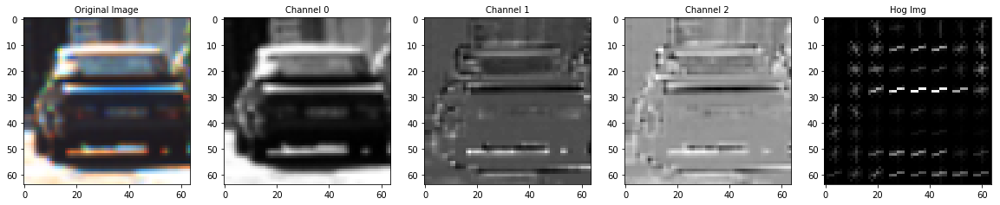

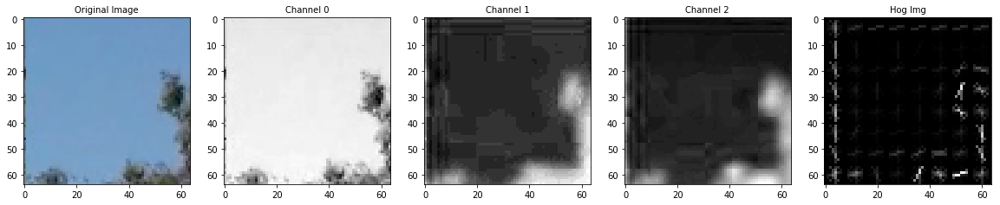

In [12]:
#%matplotlib inline

#Tunable Parameters
colorspace = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9 #11 worked ok
pix_per_cell = 8 #16 worked ok
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32,32)
hist_bins=32

# Divide up into cars and notcars
cars = glob.glob('datasets/combinedset-cleanedup/vehicles/*.png')
notcars = glob.glob('datasets/combinedset-cleanedup/non-vehicles/*.png')
        
print("Number of images: ", len(cars)+len(notcars))
print("Number of 'Car'     images: ", len(cars))
print("Number of 'Not Car' images: ", len(notcars))
        
# Reduce the sample size because HOG features are slow to compute
# The quiz evaluator times out after 13s of CPU time
#sample_size = 4
#cars = cars[0:sample_size]
#notcars = notcars[0:sample_size]

##Visualize example of hog features
print("Testing example hog")
car_eximg = read_img(cars[0])
car_img_cspace = convert_color(car_eximg,colorspace)


notcar_eximg = read_img(notcars[0])
notcar_img_cspace = convert_color(notcar_eximg,colorspace)

print("Example car image is: ", cars[0])
print("Shape: ", car_eximg.shape)
print("Example notcar image is: ", notcars[0])
print("Shape: ", notcar_eximg.shape)
print()
print("Example feature extract beginning")
t=time.time()
car_feat, car_hog_img = extract_features(car_eximg,spatial_feat=True,colorhist_feat=True,hog_feat=True,
                                          cspace=colorspace,spatial_size=spatial_size,hist_bins=hist_bins,
                                          orient=orient,pix_per_cell=pix_per_cell,
                                          cell_per_block=cell_per_block,hog_channel=hog_channel,hog_vis=True)
notcar_feat, notcar_hog_img = extract_features(notcar_eximg,spatial_feat=True,colorhist_feat=True,hog_feat=True,
                                          cspace=colorspace,spatial_size=spatial_size,hist_bins=hist_bins,
                                          orient=orient,pix_per_cell=pix_per_cell,
                                          cell_per_block=cell_per_block,hog_channel=hog_channel,hog_vis=True)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract example HOG features...')

#Visualize the examplehog
visualize_hog_and_cspace(orig_img=car_eximg,cconv_img=car_img_cspace,hog_img=car_hog_img)
visualize_hog_and_cspace(orig_img=notcar_eximg,cconv_img=notcar_img_cspace,hog_img=notcar_hog_img)
###Train
car_features = []
notcar_features = []
print("Beginning bulk extraction..")
t=time.time()
for carimg_file in cars:
    carimg = read_img(carimg_file)
    carfeat = extract_features(carimg,spatial_feat=True,colorhist_feat=True,hog_feat=True,
                                          cspace=colorspace,spatial_size=spatial_size,hist_bins=hist_bins,
                                          orient=orient,pix_per_cell=pix_per_cell,
                                          cell_per_block=cell_per_block,hog_channel=hog_channel,hog_vis=False)
    car_feats =  np.hstack((carfeat[0], carfeat[1], carfeat[2]))
    car_features.append(car_feats)
    
for ncarimg_file in notcars:
    ncarimg = read_img(ncarimg_file)   
    ncarfeat = extract_features(ncarimg,spatial_feat=True,colorhist_feat=True,hog_feat=True,
                                          cspace=colorspace,spatial_size=spatial_size,hist_bins=hist_bins,
                                          orient=orient,pix_per_cell=pix_per_cell,
                                          cell_per_block=cell_per_block,hog_channel=hog_channel,hog_vis=False)
    ncar_feats =  np.hstack((ncarfeat[0], ncarfeat[1], ncarfeat[2]))
    notcar_features.append(ncar_feats)
    
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

## Use a linear SVC 
svc = LinearSVC(C=0.05)
##

# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

# Check the prediction time for a single sample
t=time.time()
n_predict = 10

print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')
print()
print("Saving classifier..")
svc_pickle = {}
svc_pickle["svc"] = svc
svc_pickle["scaler"] = X_scaler
svc_pickle["orient"] = orient
svc_pickle["pix_per_cell"] = pix_per_cell
svc_pickle["cell_per_block"] = cell_per_block
svc_pickle["spatial_size"] = spatial_size
svc_pickle["hist_bins"] = hist_bins
svc_pickle["colorspace"] = colorspace
pickle.dump( svc_pickle, open( "svc_pickle.p", "wb" ) )
print("Classifier saved to 'svc_pickle.p'.")


## 3.0 Implementing HOG and Feature Extraction

In [2]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img,xsearch,ysearch, scale, svc, X_scaler, colorspace, 
              orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    totalhits = 0
    iterations = 0
    xstart = xsearch[0]
    xstop = xsearch[1]
    ystart = ysearch[0]
    ystop = ysearch[1]
    draw_img = np.copy(img)
    
    img_tosearch = img[ystart:ystop,xstart:xstop,:]
    ctrans_tosearch = convert_color(img_tosearch, cspace=colorspace)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1 ##added one
    
    # Compute individual channel HOG features for the entire image
    hog1, hog1_img = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=False)
    hog2, hog2_img = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=False)
    hog3, hog3_img = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=False)
    boxes = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            iterations += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction

            test_stacked = np.hstack((spatial_features, hist_features,hog_features))
            test_reshaped = test_stacked.reshape(1, -1)
            test_features = X_scaler.transform(test_reshaped)
            test_prediction = svc.predict(test_features)
            
            #test_prediction = 1
            
            if test_prediction == 1:
                #((x1, y1), (x2, y2))
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                top_x = xbox_left + xstart
                top_y = ytop_draw + ystart
                btm_x = xbox_left + win_draw + xstart #xstart is 0.
                btm_y = ytop_draw + win_draw + ystart
                boxes.append(((top_x,top_y),(btm_x,btm_y)))
    return boxes, iterations

print("STATUS: find_cars() defined.")

STATUS: find_cars() defined.


## 3.1 Testing find_cars()

File:  test_images\test1.jpg
No. far boxes:  14
No. iterations:  328
No. med boxes:  12
No. iterations:  156

File:  test_images\test2.jpg
No. far boxes:  0
No. iterations:  328
No. med boxes:  0
No. iterations:  156

File:  test_images\test3.jpg
No. far boxes:  3
No. iterations:  328
No. med boxes:  1
No. iterations:  156

File:  test_images\test4.jpg
No. far boxes:  17
No. iterations:  328
No. med boxes:  13
No. iterations:  156

File:  test_images\test5.jpg
No. far boxes:  16
No. iterations:  328
No. med boxes:  12
No. iterations:  156

File:  test_images\test6.jpg
No. far boxes:  21
No. iterations:  328
No. med boxes:  17
No. iterations:  156

File:  test_images\test_118.jpg
No. far boxes:  5
No. iterations:  328
No. med boxes:  2
No. iterations:  156

File:  saved_frames/project_video_data/project_video/697.png
No. far boxes:  11
No. iterations:  328
No. med boxes:  5
No. iterations:  156



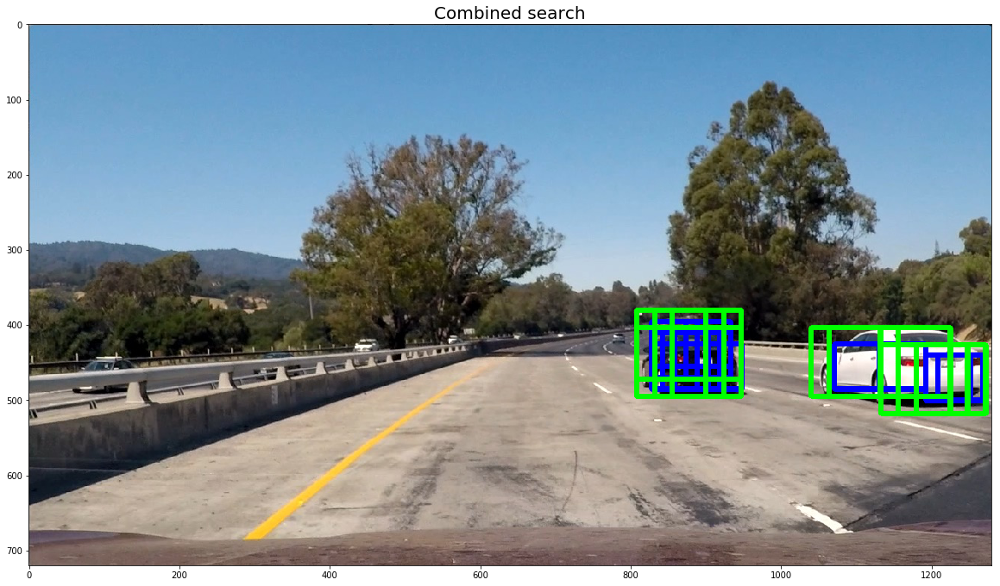

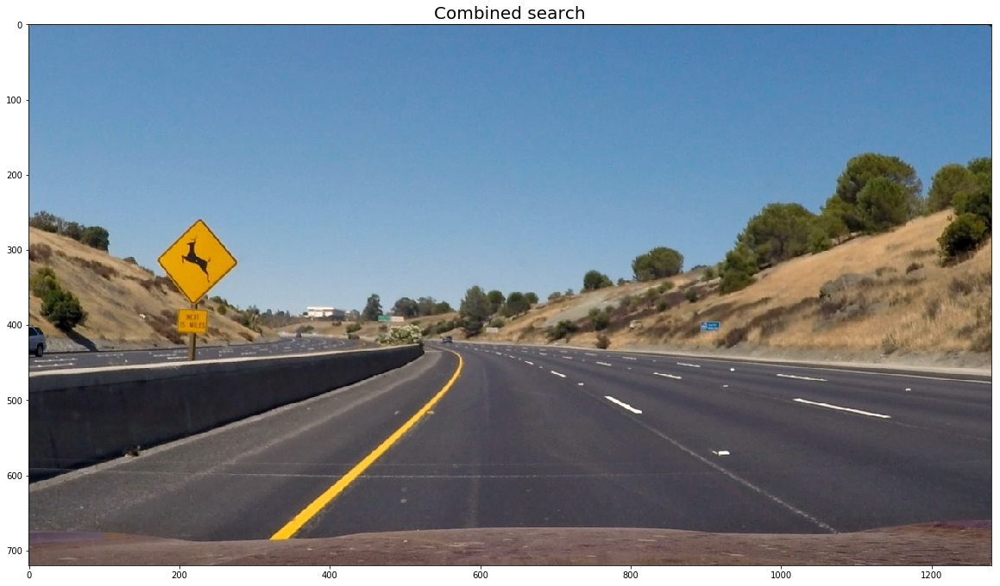

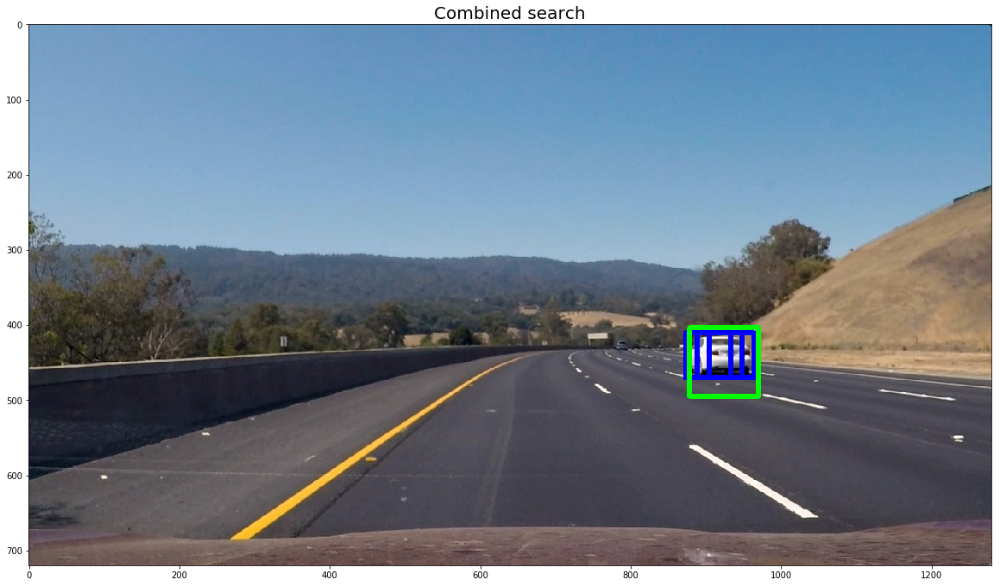

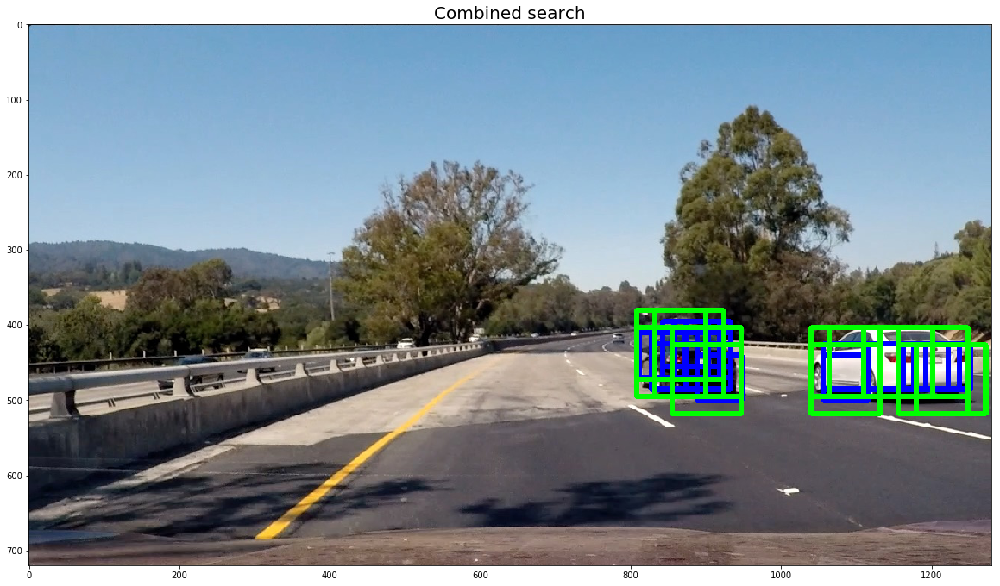

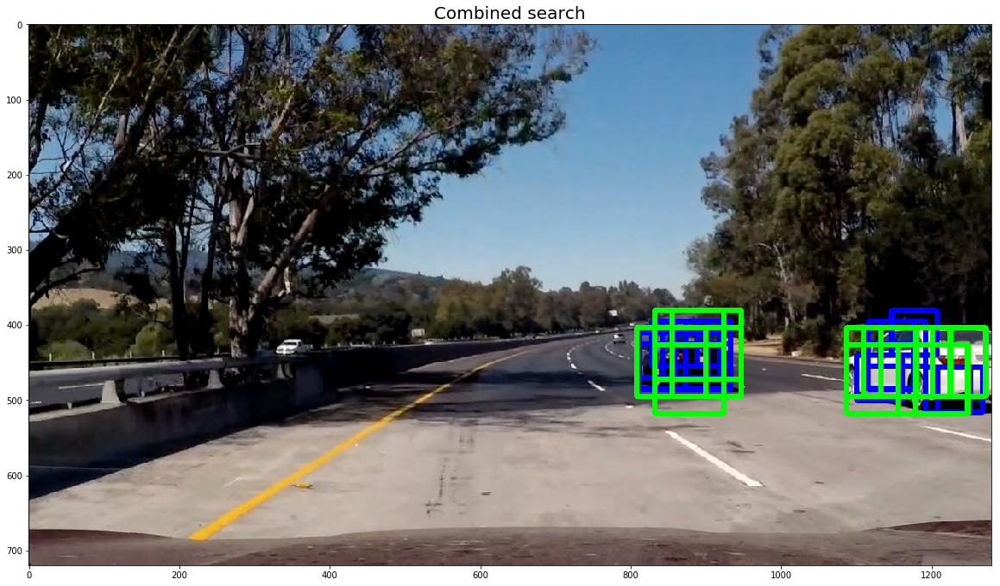

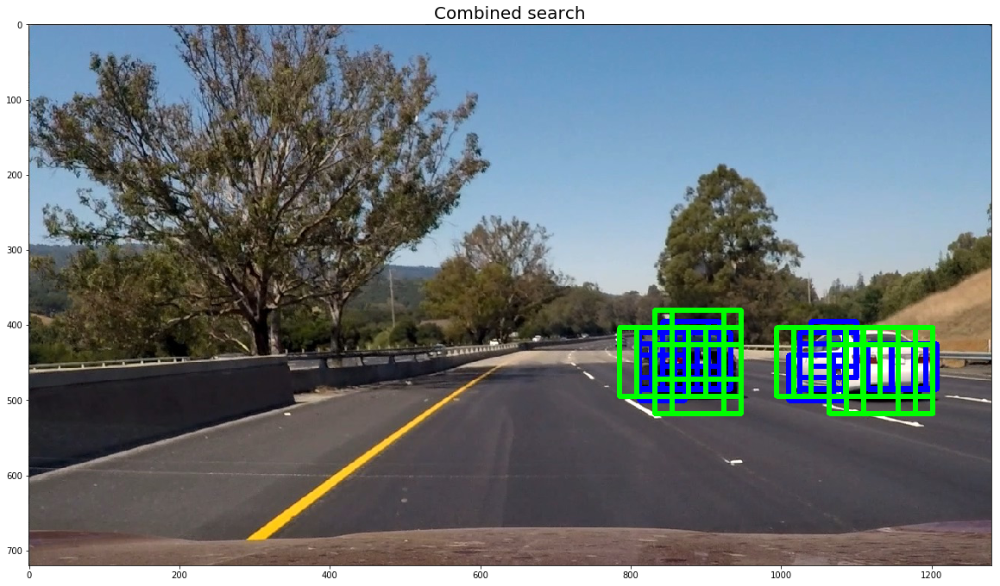

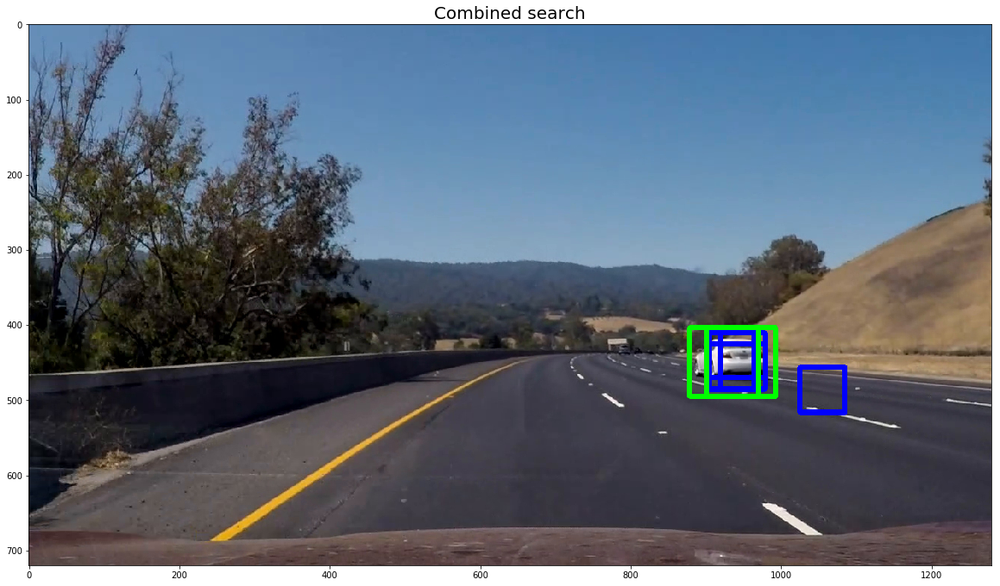

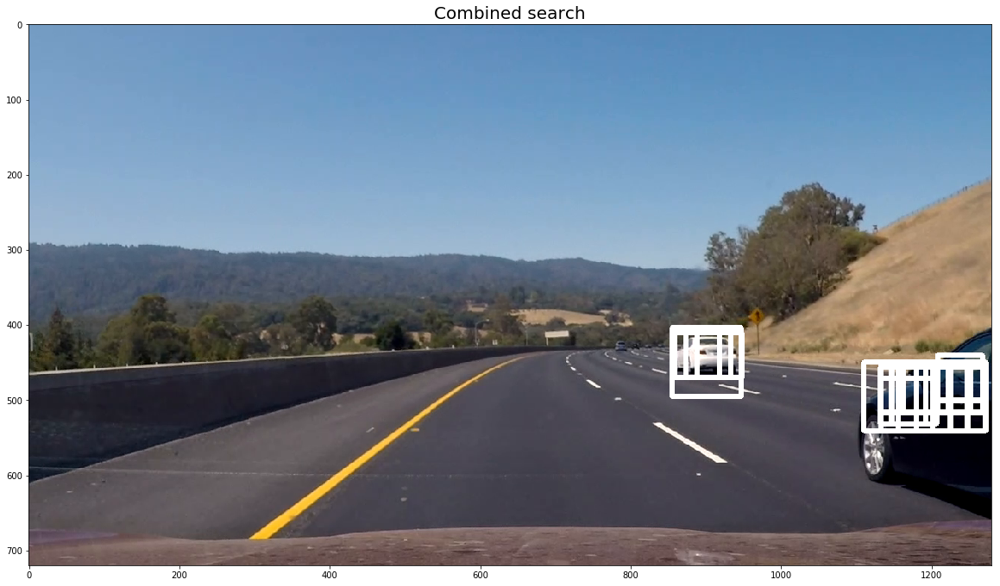

In [3]:
%matplotlib inline
##LOAD PARAMETERS
svc_pickle = pickle.load( open("svc_pickle.p", "rb" ) )
classifier = svc_pickle["svc"]
X_scaler = svc_pickle["scaler"]
colorspace = svc_pickle["colorspace"]
orient = svc_pickle["orient"]
pix_per_cell = svc_pickle["pix_per_cell"]
cell_per_block = svc_pickle["cell_per_block"]
spatial_size = svc_pickle["spatial_size"]
hist_bins = svc_pickle["hist_bins"]
##

def test_find_cars(img,vis=False):
    #Bring in test image
    overall_img = np.copy(img)
    far_boxes = []
    med_boxes = []
    close_boxes =[]
    
    ## Search for far distance cars
    xsearch = [600,1280]
    ysearch = [380,550]
    scale = .95
    far_boxes, iterations = find_cars(img,xsearch, ysearch, scale,
                           classifier, X_scaler, colorspace, orient, pix_per_cell, cell_per_block,
                           spatial_size, hist_bins)
    
    if(vis==True):
        print("No. far boxes: ", len(far_boxes))
        print("No. iterations: ", iterations)
    
        ## Visualize far distance results
        far_img = np.copy(img)
        for box in far_boxes:
            cv2.rectangle(far_img,box[0],box[1],(0,0,255),6)
            cv2.rectangle(overall_img,box[0],box[1],(0,0,255),6)
    
    ## Search medium distance cars
    xsearch = [600,1280]
    ysearch = [380,600]
    scale = 1.45
    med_boxes, iterations = find_cars(img,xsearch,ysearch,scale,
                                      classifier, X_scaler, colorspace, orient, pix_per_cell, cell_per_block,
                                      spatial_size, hist_bins)
    if(vis==True):
        print("No. med boxes: ", len(med_boxes))
        print("No. iterations: ", iterations)
        ## Visualize medium distance results
        med_img = np.copy(img)
        for box in med_boxes:
            cv2.rectangle(med_img,box[0],box[1],(0,255,0),6)
            cv2.rectangle(overall_img,box[0],box[1],(0,255,0),6)

    all_boxes = far_boxes + med_boxes + close_boxes
    
    if(vis==True):
        f, (ax1) = plt.subplots(1,1,figsize=(20,20))
        ax1.imshow(overall_img)
        ax1.set_title('Combined search', fontsize=20)
    
    return all_boxes

testimgs = glob.glob("test_images/*.jpg")
testimgs.append("saved_frames/project_video_data/project_video/697.png")
for tImg in testimgs:
    print("File: ",tImg)
    test_find_cars(read_img(tImg),vis=True)
    print()

## 3.2 Reducing false positives

File:  test_images\test1.jpg
Number of boxes:  26

File:  test_images\test2.jpg
Number of boxes:  0

File:  test_images\test3.jpg
Number of boxes:  4

File:  test_images\test4.jpg
Number of boxes:  30

File:  test_images\test5.jpg
Number of boxes:  28

File:  test_images\test6.jpg
Number of boxes:  38

File:  test_images\test_118.jpg
Number of boxes:  7

File:  saved_frames/project_video_data/project_video/697.png
Number of boxes:  16



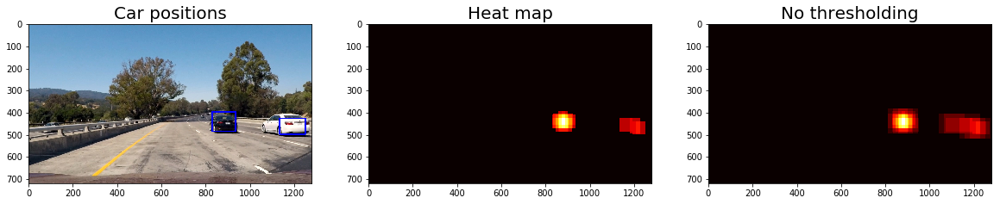

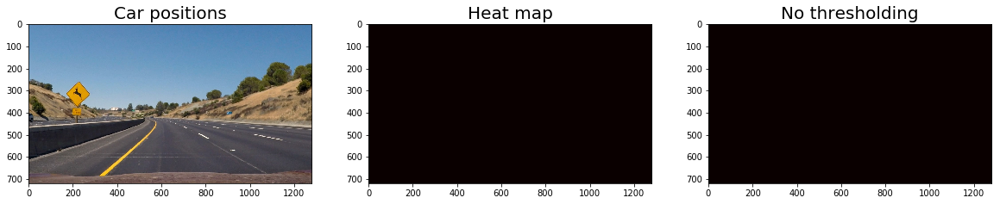

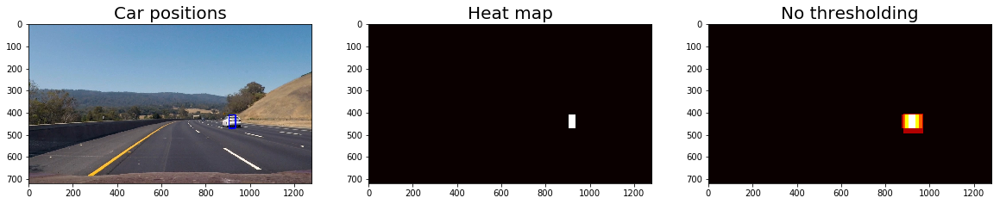

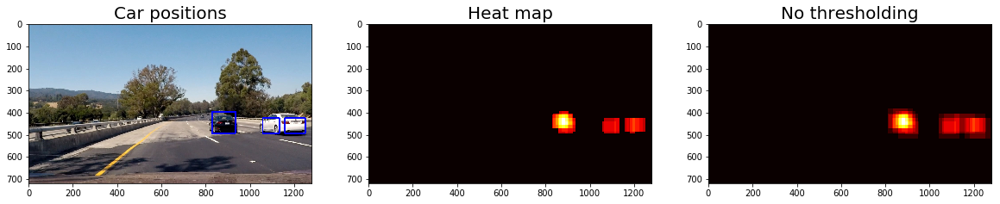

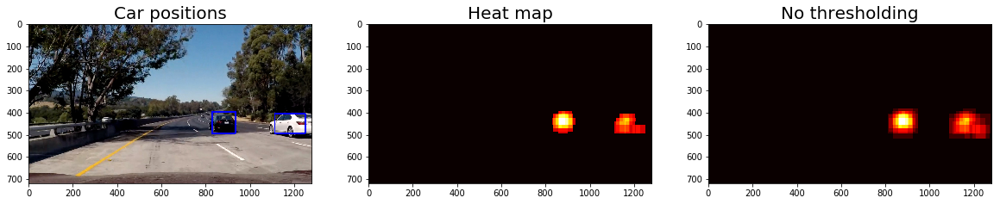

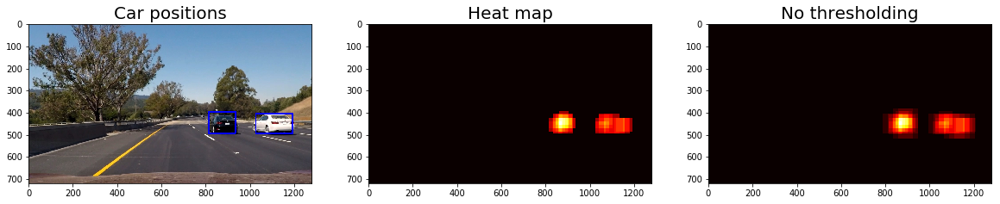

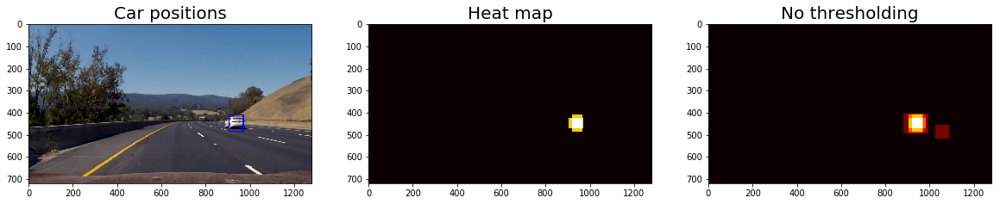

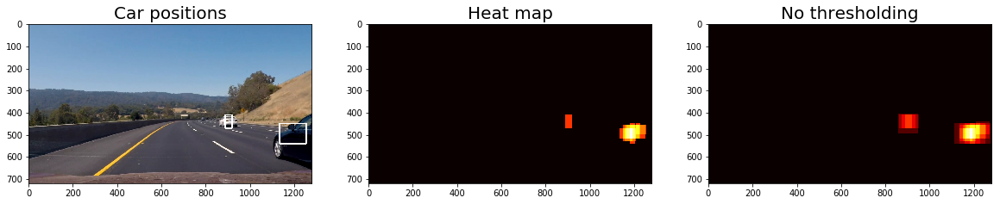

In [4]:
##First, load SVM and find boxes on test image.
#%matplotlib inline
##LOAD PARAMETERS
svc_pickle = pickle.load( open("svc_pickle.p", "rb" ) )
classifier = svc_pickle["svc"]
X_scaler = svc_pickle["scaler"]
colorspace = svc_pickle["colorspace"]
orient = svc_pickle["orient"]
pix_per_cell = svc_pickle["pix_per_cell"]
cell_per_block = svc_pickle["cell_per_block"]
spatial_size = svc_pickle["spatial_size"]
hist_bins = svc_pickle["hist_bins"]
##

heat_thresh = 3
testimgs = glob.glob("test_images/*.jpg")
testimgs.append("saved_frames/project_video_data/project_video/697.png")

for tImg in testimgs:
    print("File: ",tImg)
    img = read_img(tImg)
    all_boxes = test_find_cars(img,vis=False)
    print("Number of boxes: ", len(all_boxes))
    
    #Create empty heatmap
    heatset = np.zeros_like(img[:,:,0]).astype(np.float)

    #Pass total boxes into add heat
    heatset = add_heat(heatset,all_boxes)
    
    # Apply threshold to help remove false positives
    heatmap = np.copy(heatset) #Deep copy needed to show difference
    heatmap = apply_threshold(heatmap,heat_thresh)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmap, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)

    f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,20))
    ax1.imshow(draw_img)
    ax1.set_title('Car positions', fontsize=20)     
    ax2.imshow(heatmap,cmap='hot')
    ax2.set_title('Heat map',fontsize=20)
    ax3.imshow(heatset,cmap='hot')
    ax3.set_title('No thresholding',fontsize=20)
    
    print()

## 3.3 Heatmap Class

In [5]:
# Define a class to keep track of bounding box heat
class HeatMapSet():
    #New copy
    def __init__(self,img):
        self.current = np.zeros_like(img[:,:,0]).astype(np.float) #Holds most current heatmap prethresholding
        self.previous = [np.zeros_like(img[:,:,0]).astype(np.float) for i in range(9)] #Holds last heatmap, prethresholding
        self.decayRate = 0 #Rate at how much each heatmap is decayed during each frame
    
    #def __init__(self,img):
    #    self.current = np.zeros_like(img[:,:,0]).astype(np.float) #Holds most current heatmap prethresholding
    #    self.previous = np.zeros_like(img[:,:,0]).astype(np.float) #Holds last heatmap, prethresholding
    #    self.decayRate = 0.25 #Rate at how much each heatmap is decayed during each frame
    
    #New copy
    def updateMap(self,newMap):
        self.previous[8] = self.previous[7] - self.decayRate
        self.previous[7] = self.previous[6] - self.decayRate
        self.previous[6] = self.previous[5] - self.decayRate
        self.previous[5] = self.previous[4] - self.decayRate
        self.previous[4] = self.previous[3]
        self.previous[3] = self.previous[2]
        self.previous[2] = self.previous[1]
        self.previous[1] = self.previous[0]
        self.previous[0] = self.current
        self.current = newMap
        
        tenFrames = (self.current,self.previous[0],self.previous[1],self.previous[2],self.previous[3],
                  self.previous[4],self.previous[5],self.previous[6],self.previous[7],
                  self.previous[8])
        fiveFrames = (self.current,self.previous[0],self.previous[1],self.previous[2],self.previous[3])
        
        #print("Length of frames fifo",len(frames))
        #frames = np.array(frames)
        #weights= np.array([5,4,3,2,1,0.75])
        #print(frames.shape)
        #print(weights.shape)
        
        #avg = np.average(frames)
        #print("average: ",avg)
    
        #tenElAvg = ((2.5*self.current)+(2*self.previous[0])+(1*self.previous[1])+(1*self.previous[2])+
        #             (1*self.previous[3])+(1*self.previous[4])+(1*self.previous[5])+(1*self.previous[6])+
        #            (1*self.previous[7])+(1.5*self.previous[8]))/(2.5+2+1+1+1+1+1+1+1+1.5)
        tenElAvg = ((5*self.current)+(2.5*self.previous[0])+(1.5*self.previous[1])+(1*self.previous[2])+
                     (1*self.previous[3])+(1*self.previous[4])+(1*self.previous[5])+(1*self.previous[6])+
                    (0.75*self.previous[7])+(0.75*self.previous[8]))/(5+2.5+1.5+5+0.75+0.75)
        #tenElAvg = sum(tenFrames)/10
        #fiveElAvg = sum(fiveFrames)/5

        return tenElAvg
    
    #Old copy, previous frame only.
    #def updateMap(self,newMap):
    #    #Take in new map
    #    self.previous = self.current #Move current map to old map
    #    self.previous = self.previous - self.decayRate #Decrement all spots on old map by decayrate
    #    self.current = (0.6*newMap + 0.4*self.previous)#Add old, decayed map to new map and store as current
    #    return self.current
    
    def getCurrentMap(self):
        return self.current

## 3.4 Testing heatmap class, grow and decay rate

File:  ./saved_frames/project_video_data/project_video/670.png
Number of boxes:  4


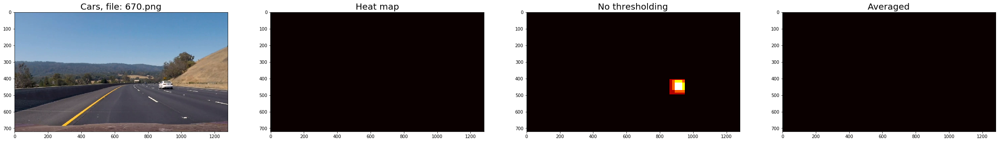

In [6]:
##Testing heatmap class
##LOAD PARAMETERS
%matplotlib inline
svc_pickle = pickle.load( open("svc_pickle.p", "rb" ) )
classifier = svc_pickle["svc"]
X_scaler = svc_pickle["scaler"]
colorspace = svc_pickle["colorspace"]
orient = svc_pickle["orient"]
pix_per_cell = svc_pickle["pix_per_cell"]
cell_per_block = svc_pickle["cell_per_block"]
spatial_size = svc_pickle["spatial_size"]
hist_bins = svc_pickle["hist_bins"]
##

test_img = read_img("./test_images/test4.jpg")
HeatTracker = HeatMapSet(test_img)
heat_class_thresh = 3

#Create test set
testSet = [] #740
for i in range(670,671):
    testSet.append('./saved_frames/project_video_data/project_video/'+str(i)+'.png')

for timgFn in testSet:
    print("File: ",timgFn)
    timg = read_img(timgFn)
    all_boxes = test_find_cars(timg,vis=False)
    print("Number of boxes: ", len(all_boxes))
    
    #Create empty heatmap
    heatset = np.zeros_like(img[:,:,0]).astype(np.float)
    #Pass total boxes into add heat
    heatset = add_heat(heatset,all_boxes)
    
    #Update HeatTracker
    avgHeatset = HeatTracker.updateMap(np.copy(heatset))
    
    #Threshold heatset to generate heatmap & remove false positives
    heatmap = apply_threshold(avgHeatset,heat_class_thresh)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(timg), labels)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmap, 0, 255)

    f, (ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(40,40))
    ax1.imshow(draw_img)
    ax1.set_title('Cars, file: '+timgFn[-7:], fontsize=20)     
    ax2.imshow(heatmap,cmap='hot')
    ax2.set_title('Heat map',fontsize=20)
    ax3.imshow(heatset,cmap='hot')
    ax3.set_title('No thresholding',fontsize=20)
    ax4.imshow(avgHeatset,cmap='hot')
    ax4.set_title('Averaged',fontsize=20)

## 4.0 Image processing pipeline

In [10]:
#VIDEO PARAMETERS
vid_heat_thresh = 3
save_frames = False

def process_image(img):
    global frame_num
    global VideoHeatTracker
    
    dst = img
    far_boxes = []
    med_boxes = []
    # Save each frame of the original video
    if save_frames:
        fn = './saved_frames/project_video/' + str(frame_num) + '.png'
        mpimg.imsave(fn, np.copy(img))

    ## Search for far distance cars
    xsearch = far_xsearch
    ysearch = far_ysearch
    scale = 0.85
    far_boxes, iterations = find_cars(img,xsearch, ysearch, scale,
                           classifier, X_scaler, colorspace, orient, pix_per_cell, cell_per_block,
                           spatial_size, hist_bins)    
    ## Search medium distance cars
    xsearch = med_xsearch
    ysearch = med_ysearch
    scale = 1.4
    med_boxes, iterations = find_cars(img,xsearch,ysearch,scale,
                                      classifier, X_scaler, colorspace, orient, pix_per_cell, cell_per_block,
                                      spatial_size, hist_bins)

    all_boxes = far_boxes + med_boxes
    
    heatset = np.zeros_like(dst[:,:,0]).astype(np.float)
    #Pass total boxes into add heat
    heatset = add_heat(heatset,all_boxes)    

    #Update HeatTracker
    avgHeatset = VideoHeatTracker.updateMap(heatset)
    
    #Threshold heatset to generate heatmap & remove false positives
    heatmap = apply_threshold(avgHeatset,vid_heat_thresh)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    dst = draw_labeled_bboxes(dst, labels)    
         
    # Add useful info, e.g. frame number to output frame
    font = cv2.FONT_HERSHEY_SIMPLEX
    msg = 'Frame: ' + str(int(frame_num))
    color = (255,255,255)
    cv2.putText(dst,msg,(50,50), font, 0.85, color, 2)

    # Save each frame of augmented video with vehicle bounding boxes
    if save_frames:
        fn = './saved_frames/windows/' + str(frame_num) + '.png'
        mpimg.imsave(fn, dst)
        fn = './saved_frames/heatmap/' + str(frame_num) + '.png'
        mpimg.imsave(fn, VideoHeatTracker.getCurrentMap())
        fn = './saved_frames/thresholded/' + str(frame_num) + '.png'
        mpimg.imsave(fn, heatmap)

    frame_num += 1
    return dst

print("STATUS: Frame by frame image processing defined.")

STATUS: Frame by frame image processing defined.


## 4.1 Creating final video

In [11]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

heatmaps = []
##Load SVC parameters
svc_pickle = pickle.load( open("svc_pickle.p", "rb" ) )
classifier = svc_pickle["svc"]
X_scaler = svc_pickle["scaler"]
colorspace = svc_pickle["colorspace"]
orient = svc_pickle["orient"]
pix_per_cell = svc_pickle["pix_per_cell"]
cell_per_block = svc_pickle["cell_per_block"]
spatial_size = svc_pickle["spatial_size"]
hist_bins = svc_pickle["hist_bins"]

##Load detection parameters
far_xsearch = [600,1280]
far_ysearch = [380,550]
med_xsearch = [600,1280]
med_ysearch = [380,600]

tImg = read_img("./test_images/test4.jpg")
VideoHeatTracker = HeatMapSet(tImg) #Initialize heat map tracker with imgsize
frame_num = 0

project_output = 'mon_project_output_weightedAvg-5-25-15-1-thresh3-85far-140med.mp4'
clip = VideoFileClip("project_video.mp4")
output_clip = clip.fl_image(process_image)
%time output_clip.write_videofile(project_output, audio=False)


[MoviePy] >>>> Building video mon_project_output_weightedAvg-5-25-15-1-thresh3-85far-140med.mp4
[MoviePy] Writing video mon_project_output_weightedAvg-5-25-15-1-thresh3-85far-140med.mp4


 66%|██████▌   | 834/1261 [39:59<19:45,  2.78s/it]

KeyboardInterrupt: 